In [174]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

In [39]:
df = pd.read_excel('./Chapter2OnlineData.xls')
df.head(10)


,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption,Positive affect,...,GINI index (World Bank estimate),"GINI index (World Bank estimate), average 2000-16","gini of household income reported in Gallup, by wp5-year","Most people can be trusted, Gallup","Most people can be trusted, WVS round 1981-1984","Most people can be trusted, WVS round 1989-1993","Most people can be trusted, WVS round 1994-1998","Most people can be trusted, WVS round 1999-2004","Most people can be trusted, WVS round 2005-2009","Most people can be trusted, WVS round 2010-2014"
0,Afghanistan,2008,3.723590,7.168690,0.450662,50.799999,0.718114,0.177889,0.881686,0.517637,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,2009,4.401778,7.333790,0.552308,51.200001,0.678896,0.200178,0.850035,0.583926,...,NaN,NaN,0.441906,0.286315,NaN,NaN,NaN,NaN,NaN,NaN
2,Afghanistan,2010,4.758381,7.386629,0.539075,51.599998,0.600127,0.134353,0.706766,0.618265,...,NaN,NaN,0.327318,0.275833,NaN,NaN,NaN,NaN,NaN,NaN
3,Afghanistan,2011,3.831719,7.415019,0.521104,51.919998,0.495901,0.172137,0.731109,0.611387,...,NaN,NaN,0.336764,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Afghanistan,2012,3.782938,7.517126,0.520637,52.240002,0.530935,0.244273,0.775620,0.710385,...,NaN,NaN,0.344540,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Afghanistan,2013,3.572100,7.522238,0.483552,52.560001,0.577955,0.070403,0.823204,0.620585,...,NaN,NaN,0.304368,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Afghanistan,2014,3.130896,7.516955,0.525568,52.880001,0.508514,0.113184,0.871242,0.531691,...,NaN,NaN,0.413974,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Afghanistan,2015,3.982855,7.500539,0.528597,53.200001,0.388928,0.089091,0.880638,0.553553,...,NaN,NaN,0.596918,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Afghanistan,2016,4.220169,7.497038,0.559072,53.000000,0.522566,0.051365,0.793246,0.564953,...,NaN,NaN,0.418629,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Afghanistan,2017,2.661718,7.497755,0.490880,52.799999,0.427011,-0.112198,0.954393,0.496349,...,NaN,NaN,0.286599,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [40]:
newdata = pd.read_excel('./WHR2018Chapter2OnlineData.xls','SupportingFactors')
newdata.head()

,country,Region indicator,"Life ladder, 2015-2017","Standard error, life ladder, 2015-2017","Log of GDP per person, 2015-2017","GDP per person, 2015-2017","Healthy life expectancy, 2015-2017","Social support, 2015-2017","Standard error, social support, 2015-2017","Freedom to make life choices, 2015-2017","Standard error, freedom to make life choices, 2015-2017","Generosity, 2015-2017, without adjustment for GDP per person","Standard error, generosity, 2015-2017","Perceptions of corruption, 2015-2017","Standard error, perceptions of corruption, 2015-2017"
0,Afghanistan,South Asia,3.631519,0.042360,7.462610,1741.687500,52.013329,0.525075,0.011119,0.445294,0.011449,0.179054,0.008331,0.879705,0.006009
1,Albania,Central and Eastern Europe,4.586040,0.055813,9.338126,11363.095703,68.871552,0.639576,0.010078,0.726340,0.009421,0.259975,0.009048,0.886778,0.005775
2,Algeria,Middle East and North Africa,5.294638,0.057087,9.540703,13914.723633,65.604858,0.776977,0.011171,0.439177,0.019161,0.128988,0.012327,0.698343,0.019293
3,Angola,Sub-Saharan Africa,3.794838,0.079919,8.741957,6260.132812,52.460709,0.765275,0.015744,0.374173,0.018346,0.106829,0.011499,0.833540,0.016014
4,Argentina,Latin America and Caribbean,6.387958,0.049497,9.842001,18807.310547,67.398483,0.905565,0.006363,0.853390,0.007526,0.163174,0.007777,0.847882,0.006881


In [41]:
# For simplicity, we take the first 9 columns to make a prediction
countryData = df.iloc[:, :9]
countryData.head()

,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2008,3.723590,7.168690,0.450662,50.799999,0.718114,0.177889,0.881686
1,Afghanistan,2009,4.401778,7.333790,0.552308,51.200001,0.678896,0.200178,0.850035
2,Afghanistan,2010,4.758381,7.386629,0.539075,51.599998,0.600127,0.134353,0.706766
3,Afghanistan,2011,3.831719,7.415019,0.521104,51.919998,0.495901,0.172137,0.731109
4,Afghanistan,2012,3.782938,7.517126,0.520637,52.240002,0.530935,0.244273,0.775620


In [60]:
#country=pd.DataFrame((countryData['Year'] ) )
#country1=countryData[(countryData['Year'] == 2018) ]
#houseNumData = pd.DataFrame(houseData[['LotArea', 'GrLivArea', 'TotalBsmtSF', 'GarageArea', 'SalePrice']])


df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_world_gdp_with_codes.csv')
#country1.head()





,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
10,Afghanistan,2018,2.694303,7.494588,0.507516,52.599998,0.373536,-0.084888,0.927606
21,Albania,2018,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
28,Algeria,2018,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704
45,Argentina,2018,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255
58,Armenia,2018,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826


In [69]:
# clean dataset
# calculate the average of each column
countryYear=countryData[(countryData['Year'] == 2018) ]
country = countryYear['Country name']

fliter_rows = []
mean_rows=[]
for each in country:
   # for y in code:
    each_df = countryYear[countryYear['Country name'] == each]
    row = [each_df[i].data[0] for i in countryYear.columns if i != 'Country name']
    row.insert(0, each)
    mean_rows.append(row)

filtered_df = pd.DataFrame(data=mean_rows,columns=['Country name','Year','Life Ladder','Log GDP per capita','Social support','Healthy life expectancy at birth','Freedom to make life choices','Generosity','Perceptions of corruption']) 
filtered_df.head()


C:\Users\cf\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: FutureWarning:

Series.data is deprecated and will be removed in a future version



,Country name,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,2018,2.694303,7.494588,0.507516,52.599998,0.373536,-0.084888,0.927606
1,Albania,2018,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
2,Algeria,2018,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704
3,Argentina,2018,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255
4,Armenia,2018,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826


In [70]:
countCode=[]
code = pd.DataFrame(df[['COUNTRY', 'CODE']])
code.head()

for x in country:
    temp=code[(code['COUNTRY'] == x) ]
    countCode.append(temp['CODE'].sum())
    
  
    

In [71]:
Region  = pd.DataFrame(newdata[['country', 'Region indicator']])
Region.head()


,country,Region indicator
0,Afghanistan,South Asia
1,Albania,Central and Eastern Europe
2,Algeria,Middle East and North Africa
3,Angola,Sub-Saharan Africa
4,Argentina,Latin America and Caribbean


In [72]:
countRegion=[]

for x in country:
    tempRegion=Region[(Region['country'] == x) ]
    countRegion.append(tempRegion['Region indicator'].sum())
    
  

In [73]:
filtered_df.insert(2, 'Region', countRegion)

In [74]:
filtered_df.insert(1, 'code', countCode)

In [89]:
#  filtered_df=mean_df.fillna(method='ffill')
filtered_df.head()

,Country name,code,Year,Region,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,AFG,2018,South Asia,2.694303,7.494588,0.507516,52.599998,0.373536,-0.084888,0.927606
1,Albania,ALB,2018,Central and Eastern Europe,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
2,Algeria,DZA,2018,Middle East and North Africa,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704
3,Argentina,ARG,2018,Latin America and Caribbean,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255
4,Armenia,ARM,2018,Commonwealth of Independent States,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826


In [90]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136 entries, 0 to 135
Data columns (total 11 columns):
Country name                        136 non-null object
code                                136 non-null object
Year                                136 non-null int64
Region                              136 non-null object
Life Ladder                         136 non-null float64
Log GDP per capita                  127 non-null float64
Social support                      136 non-null float64
Healthy life expectancy at birth    132 non-null float64
Freedom to make life choices        136 non-null float64
Generosity                          126 non-null float64
Perceptions of corruption           129 non-null float64
dtypes: float64(7), int64(1), object(3)
memory usage: 11.8+ KB


In [95]:
filtered_df=filtered_df.fillna(0)

In [96]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 136 entries, 0 to 135
Data columns (total 11 columns):
Country name                        136 non-null object
code                                136 non-null object
Year                                136 non-null int64
Region                              136 non-null object
Life Ladder                         136 non-null float64
Log GDP per capita                  136 non-null float64
Social support                      136 non-null float64
Healthy life expectancy at birth    136 non-null float64
Freedom to make life choices        136 non-null float64
Generosity                          136 non-null float64
Perceptions of corruption           136 non-null float64
dtypes: float64(7), int64(1), object(3)
memory usage: 11.8+ KB


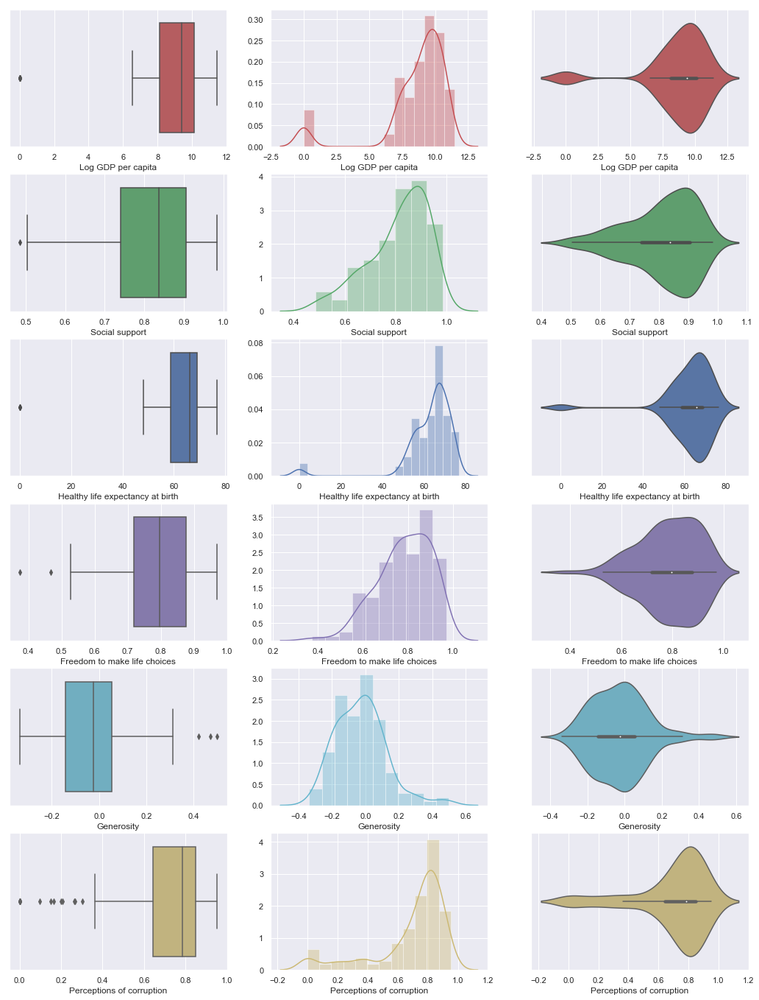

In [101]:
'''
Dataset Cleaning:
using front fill / back fill to replace NA, this would not affect the plots too much
due to small amount of NA's and the relatively large number of statistics (0~4 NA compared to 160+ non-NA)
and from the box plot, if the additional fill is an anomoly/outlier, it still won't affect the plots significantly
'''

# filled_mean = mean_df.fillna(method='bfill')
# Draw the distributions of all variables
f, axes = plt.subplots(6, 3, figsize=(18, 24))
colors = ["r", "g", "b", "m", "c", "y"]
cols = filtered_df.columns.drop(['Country name', 'Life Ladder','code','Region','Year'])

count = 0
for var in cols:
    sb.boxplot(filtered_df[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.distplot(filtered_df[var], color = colors[count], ax = axes[count,1])
    sb.violinplot(filtered_df[var], color = colors[count], ax = axes[count,2])
    count += 1

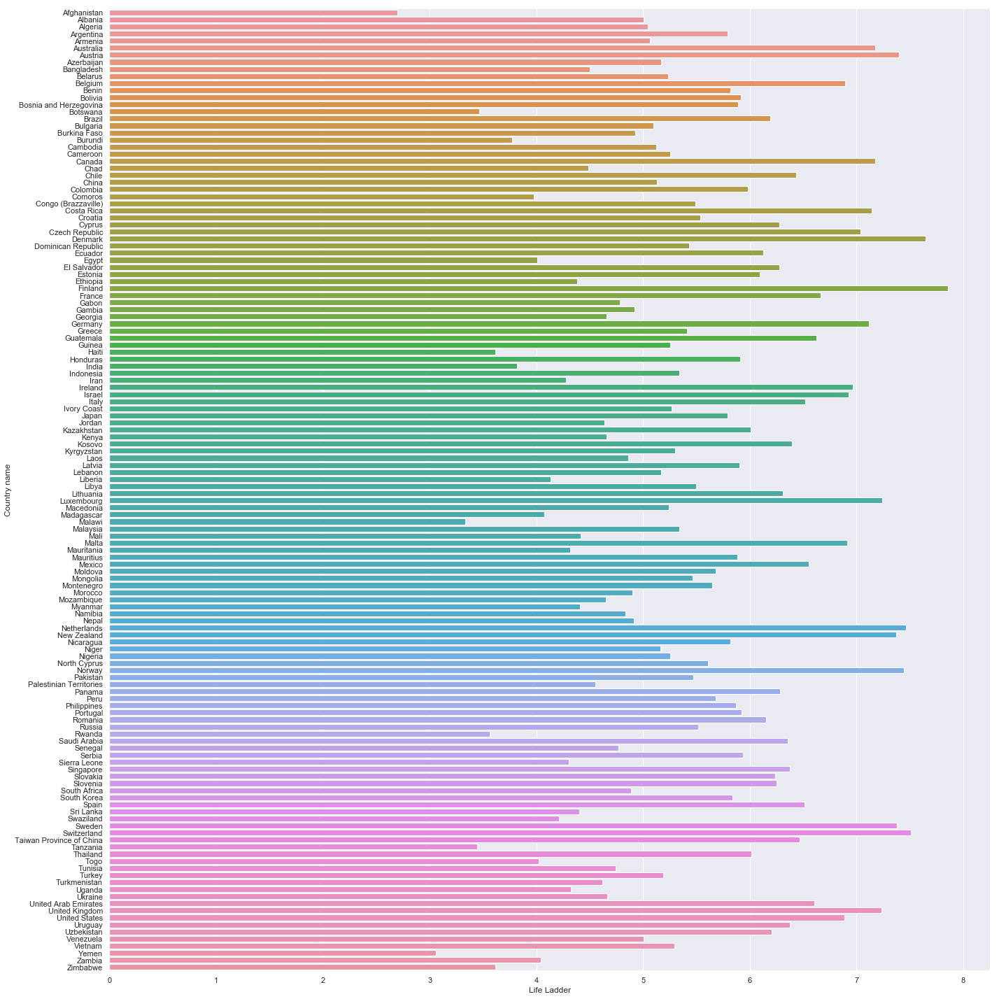

In [157]:
sb.catplot(x='Life Ladder',y='Country name', data = filtered_df, kind = "bar", height =20)

In [192]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)



data =[ dict(
      type = 'choropleth',
        colorscale = 'Rainbow',
        locations = filtered_df['code'],
       z = filtered_df['Life Ladder'],
        text = filtered_df['Country name'],

        colorbar = dict(
            title = 'Life Ladder', 
            titlefont=dict(size=25),
            tickfont=dict(size=18))
      ) ]


#[go.Choropleth(
#    type = 'orthographic',
#    locations = mean_df['code'],
#    z = mean_df['Life Ladder'],
#  text = mean_df['Country name'],
   # colorscale = [
  #      [0, "rgb(5, 10, 172)"],
  #      [0.35, "rgb(40, 60, 190)"],
   #     [0.5, "rgb(70, 100, 245)"],
   #     [0.6, "rgb(90, 120, 245)"],
  #      [0.7, "rgb(106, 137, 247)"],
   #     [1, "rgb(220, 220, 220)"]
  #  ],
#    colorscale = 'Rainbow',
#    autocolorscale = False,
 #   reversescale = True,
 #   marker = go.choropleth.Marker(
#        line = go.choropleth.marker.Line(
 #           color = 'rgb(180,180,180)',
 #           width = 0.5
 #       )),
  #  colorbar = go.choropleth.ColorBar(
  #      tickprefix = '$',
 #       title = 'GDP<br>Billions US$'),
    
#)]

layout = go.Layout(
    title = go.layout.Title(
        text = '2018 Life Ladder'
    ),
    geo = go.layout.Geo(
          showland = True,
        showlakes = True,
        showcountries = True,
        showocean = True,
        countrywidth = 0.5,
        landcolor = 'rgb(255, 255, 255)',
       # lakecolor = 'rgb(0, 255, 255)',
        oceancolor = 'rgb(0, 255, 255)',
        showframe = True,
        showcoastlines = True,
        projection = go.layout.geo.Projection(
            type = 'equirectangular'
        )
    ),
    annotations = [go.layout.Annotation(
        x = 0.55,
        y = 0.1,
        xref = 'paper',
        yref = 'paper',
    
        showarrow = False
    )]
)

fig = go.Figure(data = data, layout = layout)
py.iplot(fig, filename='world.html')

In [191]:
py.iplot(mean_rows, filename='jupyter-basic_bar')


ValueError: 
    Invalid element(s) received for the 'data' property of 
        Invalid elements include: [['Afghanistan', 2018, 2.694303274154663, 7.4945878982543945, 0.5075158476829529, 52.599998474121094, 0.37353554368019104, -0.08488787710666656, 0.9276056885719299], ['Albania', 2018, 5.0044026374816895, 9.412399291992188, 0.6835916638374329, 68.69999694824219, 0.8242123126983643, 0.005384950898587704, 0.8991293907165527], ['Algeria', 2018, 5.043086051940918, 9.557951927185059, 0.7986513376235962, 65.9000015258789, 0.5833805799484253, -0.17241300642490387, 0.7587041258811951], ['Argentina', 2018, 5.792796611785889, 9.809971809387207, 0.8999115824699402, 68.80000305175781, 0.8458946943283081, -0.20693662762641907, 0.8552552461624146], ['Armenia', 2018, 5.062448501586914, 9.119423866271973, 0.8144490122795105, 66.9000015258789, 0.8076436519622803, -0.14910869300365448, 0.6768263578414917], ['Australia', 2018, 7.176993370056152, 10.721020698547363, 0.9401372671127319, 73.5999984741211, 0.9160281419754028, 0.13779540359973907, 0.40464749932289124], ['Austria', 2018, 7.396001815795898, 10.74189281463623, 0.9116681218147278, 73.0, 0.9041119813919067, 0.05155233293771744, 0.5230605602264404], ['Azerbaijan', 2018, 5.167995452880859, 9.678013801574707, 0.7812299132347107, 65.5, 0.772449254989624, -0.25179529190063477, 0.5612062811851501], ['Bangladesh', 2018, 4.4992170333862305, 8.220746040344238, 0.7055560350418091, 64.30000305175781, 0.9014708399772644, -0.03800833597779274, 0.7014212012290955], ['Belarus', 2018, 5.23376989364624, 9.778738975524902, 0.9045692682266235, 66.0999984741211, 0.6436023712158203, -0.18186484277248383, 0.7184554934501648]]

    The 'data' property is a tuple of trace instances
    that may be specified as:
      - A list or tuple of trace instances
        (e.g. [Scatter(...), Bar(...)])
      - A list or tuple of dicts of string/value properties where:
        - The 'type' property specifies the trace type
            One of: ['area', 'bar', 'barpolar', 'box',
                     'candlestick', 'carpet', 'choropleth', 'cone',
                     'contour', 'contourcarpet', 'heatmap',
                     'heatmapgl', 'histogram', 'histogram2d',
                     'histogram2dcontour', 'isosurface', 'mesh3d',
                     'ohlc', 'parcats', 'parcoords', 'pie',
                     'pointcloud', 'sankey', 'scatter',
                     'scatter3d', 'scattercarpet', 'scattergeo',
                     'scattergl', 'scattermapbox', 'scatterpolar',
                     'scatterpolargl', 'scatterternary', 'splom',
                     'streamtube', 'surface', 'table', 'violin']

        - All remaining properties are passed to the constructor of
          the specified trace type

        (e.g. [{'type': 'scatter', ...}, {'type': 'bar, ...}])

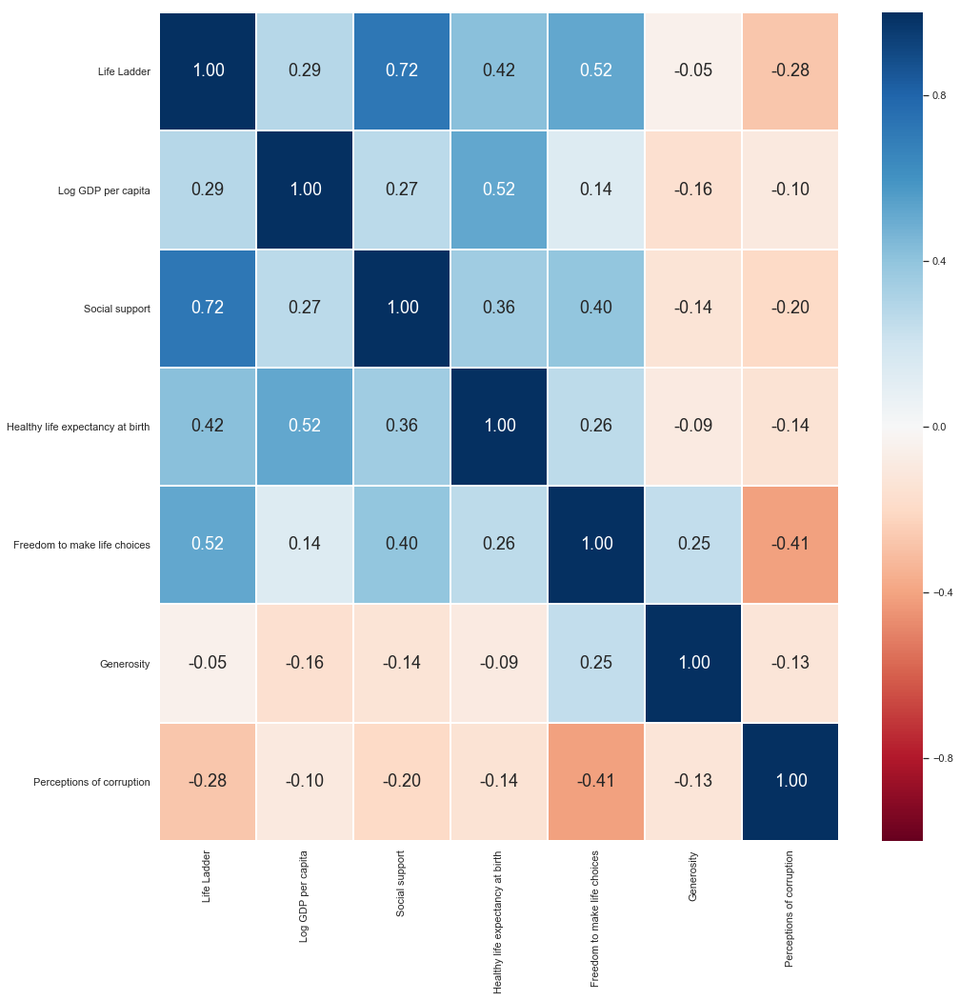

In [172]:



filteredData=filtered_df.drop(['Year'], axis=1)
# the heatmap of the filtered dataset
f, axes = plt.subplots(1, 1, figsize=(16, 16))
sb.heatmap(filteredData.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

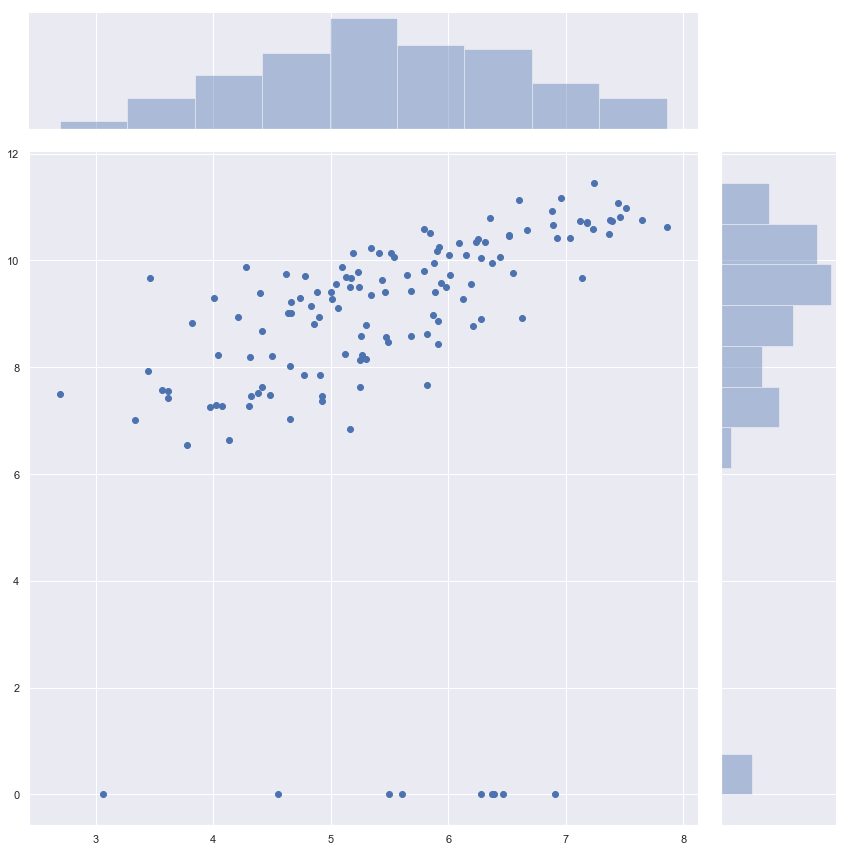

In [118]:
lifeLadder = pd.DataFrame(filteredData['Life Ladder'])
GDP = pd.DataFrame(filteredData['Log GDP per capita'])

sb.jointplot(lifeLadder, GDP, height = 12)

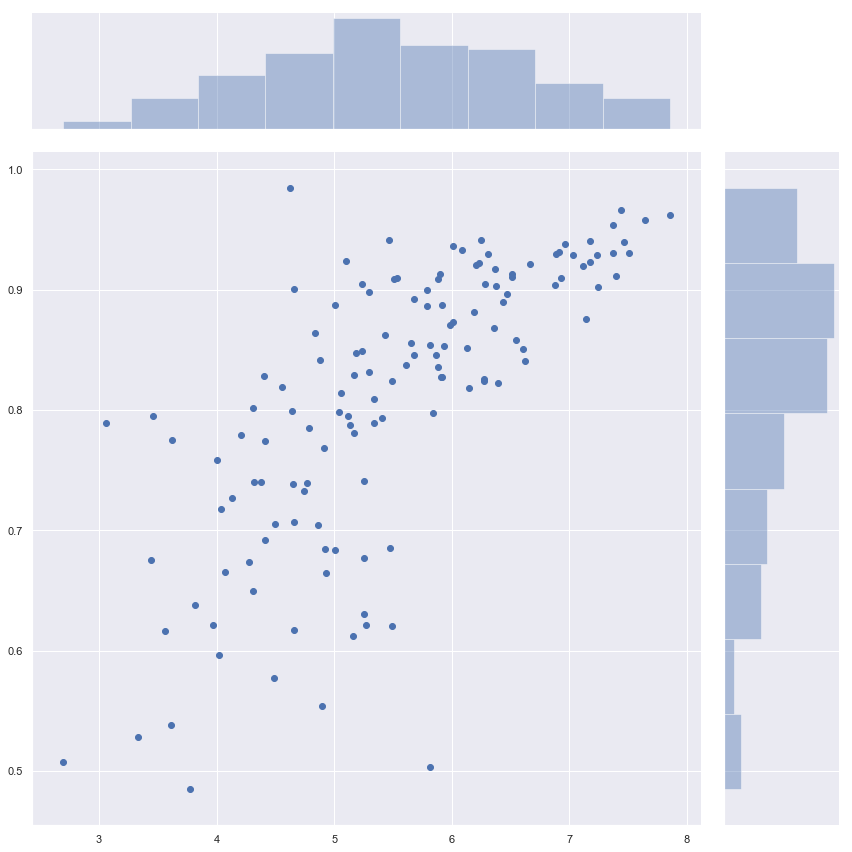

In [121]:

SocialSupport = pd.DataFrame(filteredData['Social support'])

sb.jointplot(lifeLadder, SocialSupport, height = 12)

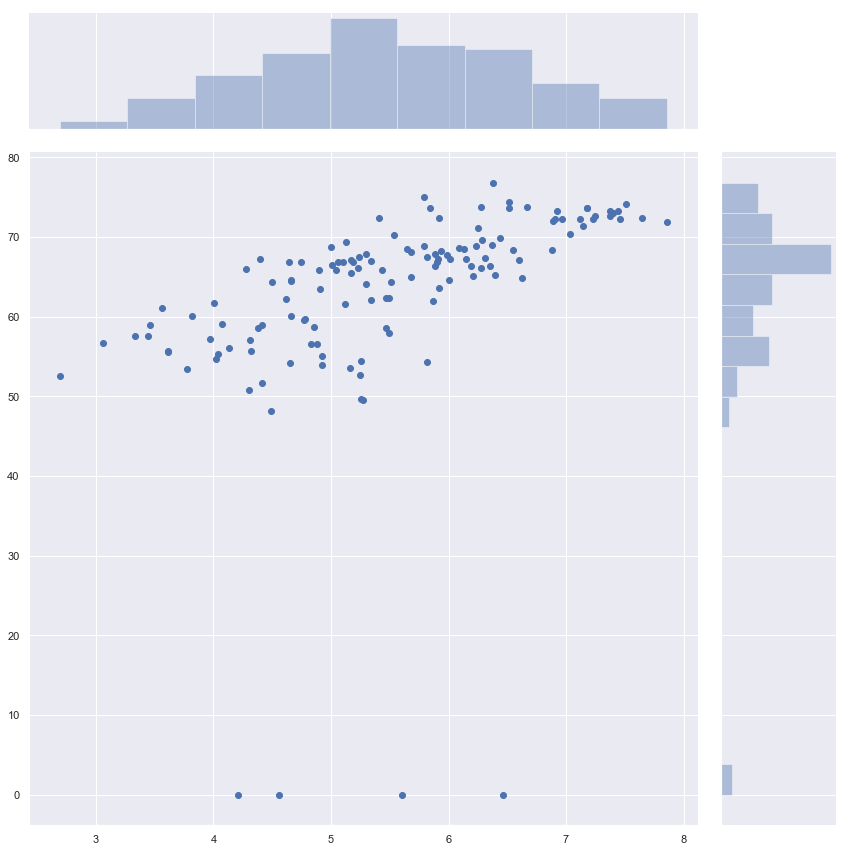

In [122]:

lifeExpectancy = pd.DataFrame(filteredData['Healthy life expectancy at birth'])

sb.jointplot(lifeLadder, lifeExpectancy, height = 12)

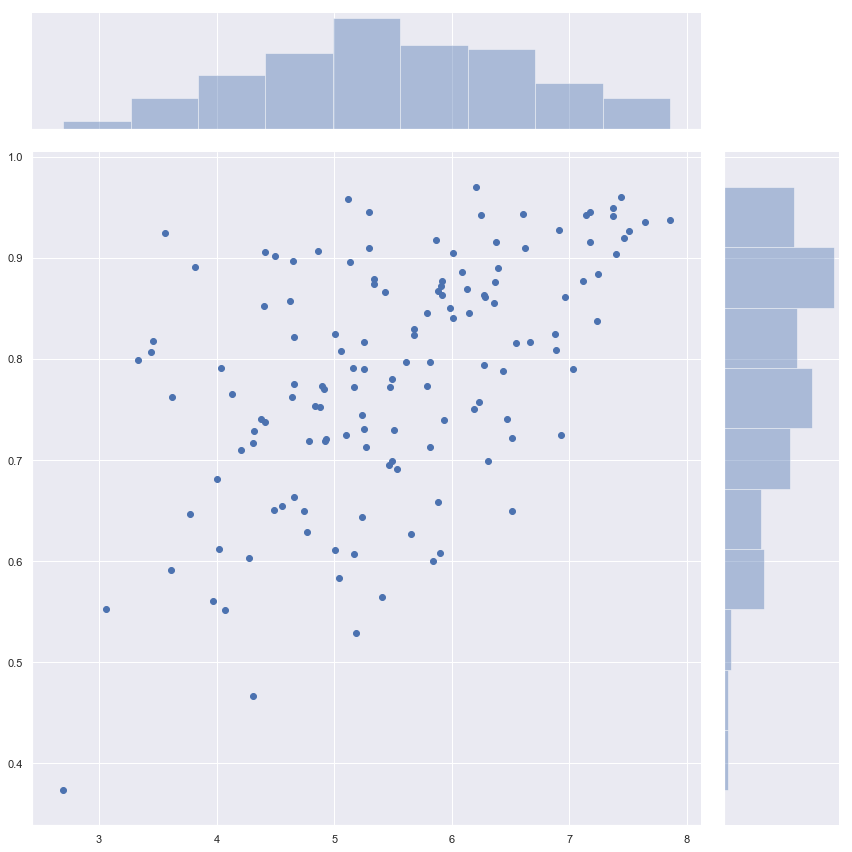

In [123]:

freedom = pd.DataFrame(filteredData['Freedom to make life choices'])

sb.jointplot(lifeLadder, freedom, height = 12)

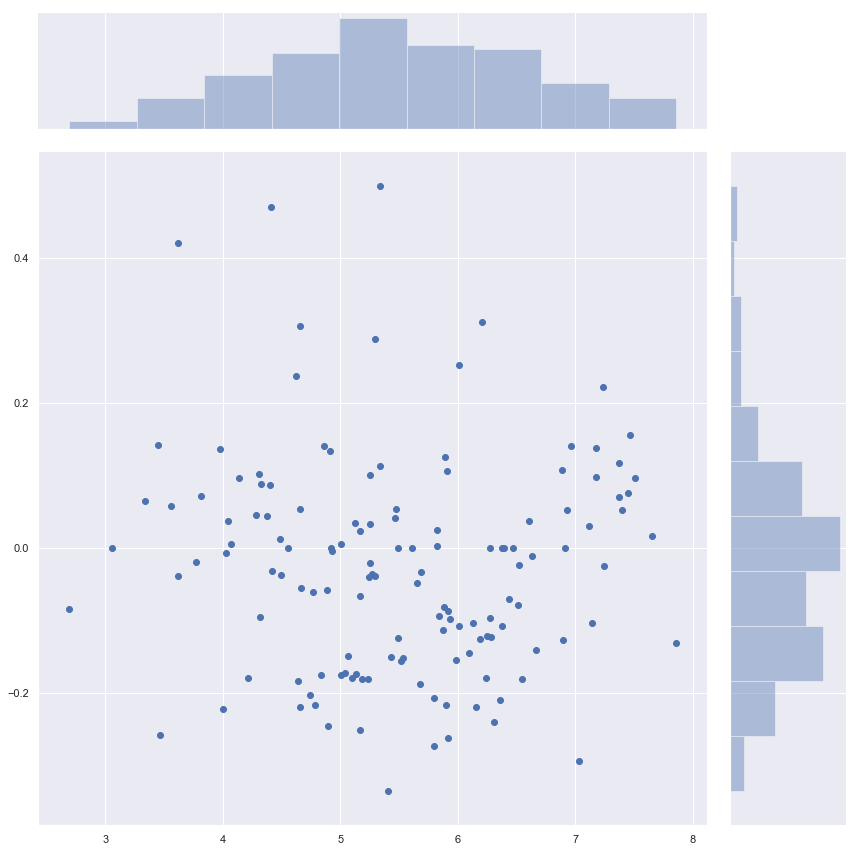

In [208]:
generosity = pd.DataFrame(filteredData['Generosity'])

sb.jointplot(lifeLadder, generosity, height = 12)

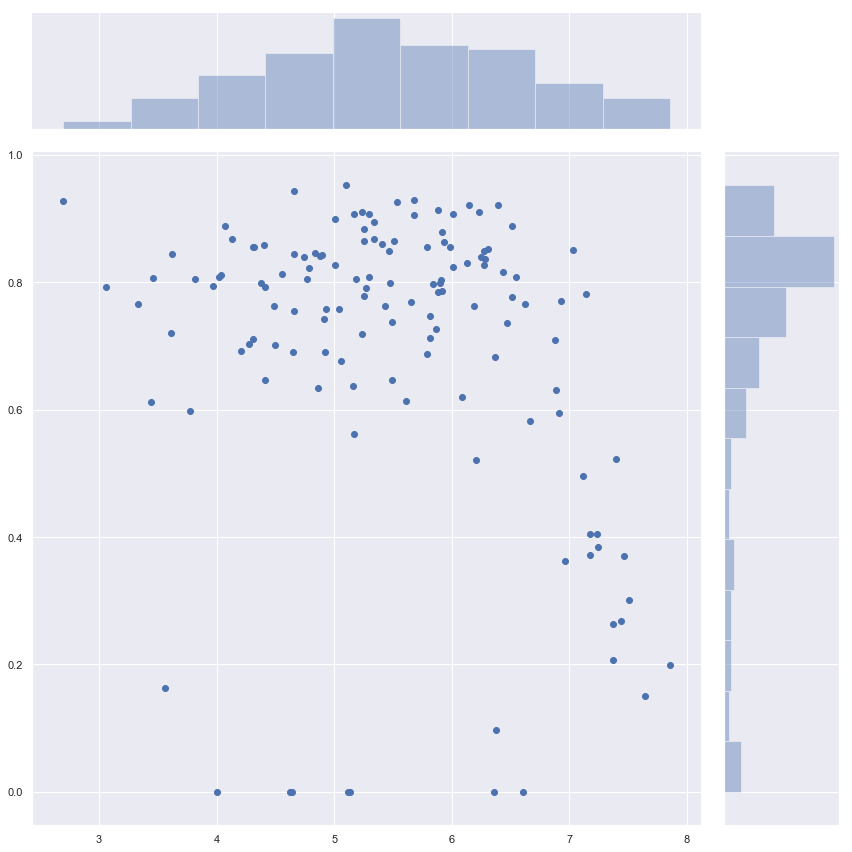

In [124]:

Corruption = pd.DataFrame(filteredData['Perceptions of corruption'])

sb.jointplot(lifeLadder, Corruption, height = 12)




In [125]:
# Import LinearRegression model from Scikit-Learn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
# Create a Linear Regression object
linreg = LinearRegression()

In [126]:

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(lifeLadder, GDP, train_size=0.6,test_size = 0.4)

print("Train Set :", X_train.shape, y_train.shape)
print("Test Set  :", X_test.shape, y_test.shape)

Train Set : (81, 1) (81, 1)
Test Set  : (55, 1) (55, 1)


In [127]:
# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"])

Intercept of Regression 	: b =  [5.67012801]
Coefficients of Regression 	: a =  [[0.53289522]]



,Predictors,Coefficients
0,Life Ladder,0.532895


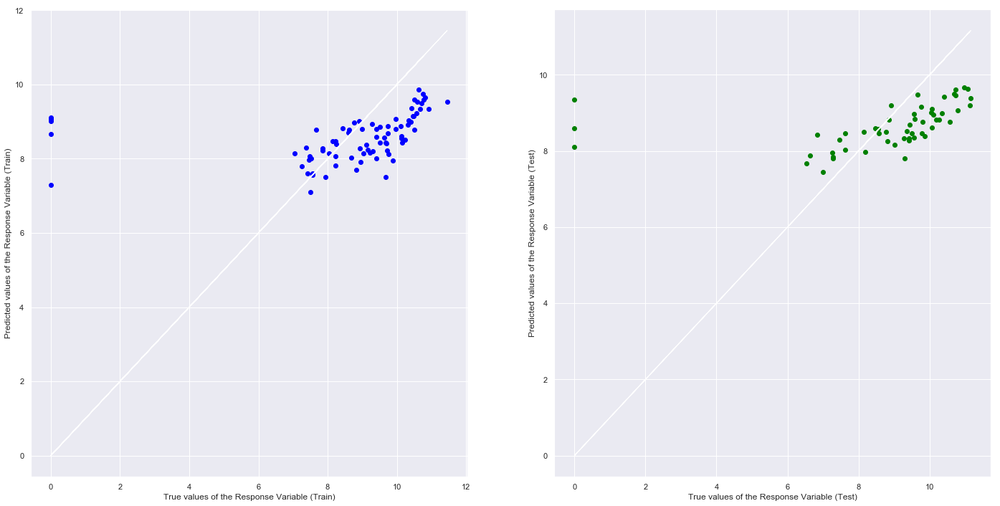

In [128]:
# Predict the Total values from Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

In [136]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(SocialSupport, GDP, train_size=0.6,test_size = 0.4)

print("Train Set :", X_train.shape, y_train.shape)
print("Test Set  :", X_test.shape, y_test.shape)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()



Train Set : (81, 1) (81, 1)
Test Set  : (55, 1) (55, 1)
Intercept of Regression 	: b =  [4.14692973]
Coefficients of Regression 	: a =  [[5.53140683]]



In [130]:
# Print the Coefficients against Predictors
pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"])

,Predictors,Coefficients
0,Life Ladder,0.532895


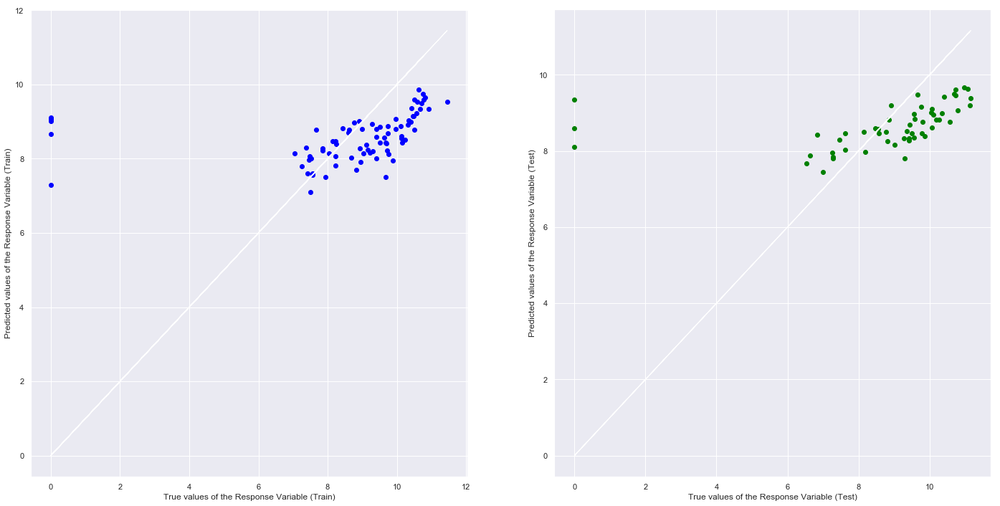

In [131]:
# Predict the Total values from Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

In [135]:
# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(lifeExpectancy, GDP, train_size=0.6,test_size = 0.4)

print("Train Set :", X_train.shape, y_train.shape)
print("Test Set  :", X_test.shape, y_test.shape)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()


Train Set : (81, 1) (81, 1)
Test Set  : (55, 1) (55, 1)
Intercept of Regression 	: b =  [3.95165473]
Coefficients of Regression 	: a =  [[0.07916291]]



In [134]:
# Print the Coefficients against Predictors
pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"])

,Predictors,Coefficients
0,Healthy life expectancy at birth,0.122767


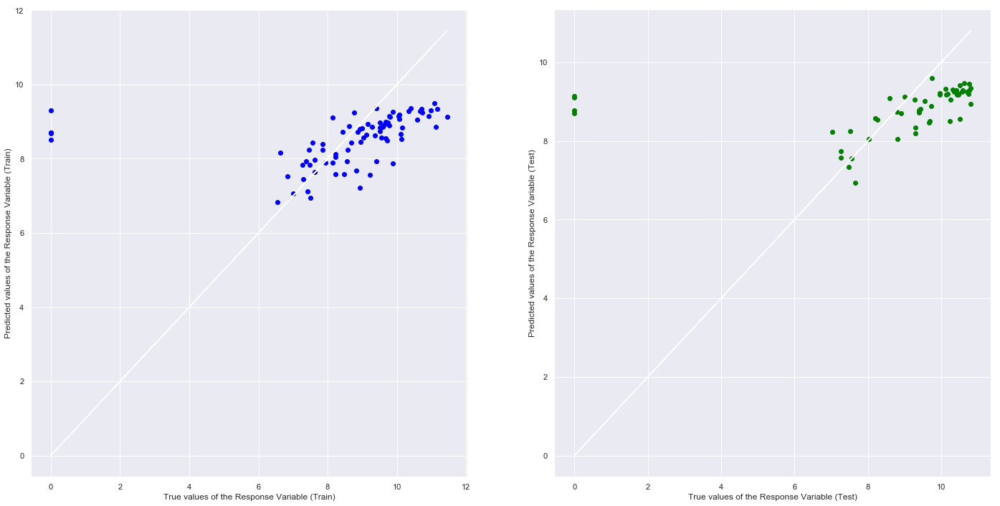

In [137]:
# Predict the Total values from Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

Intercept of Regression 	: b =  [-1.3734669]
Coefficients of Regression 	: a =  [[ 0.01733225  5.02818914  0.02094938  1.69835824 -0.03260214]]

                         Predictors  Coefficients
0                Log GDP per capita      0.017332
1                    Social support      5.028189
2  Healthy life expectancy at birth      0.020949
3      Freedom to make life choices      1.698358
4                        Generosity     -0.032602



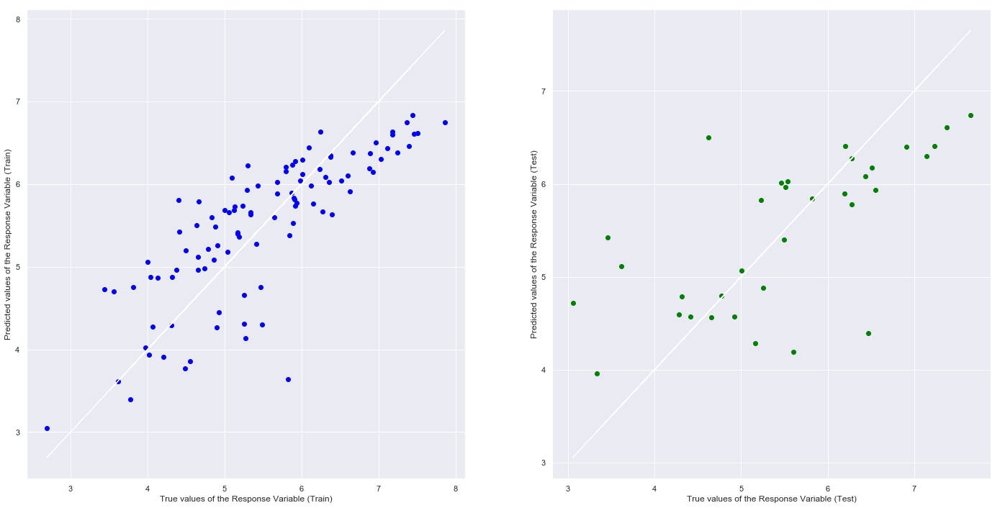

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.6407095042305783
Mean Squared Error (MSE) 	: 0.4122760810554379

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.45772192459425304
Mean Squared Error (MSE) 	: 0.7549420764780751


In [143]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Extract Response and Predictors
predictors = ["Log GDP per capita", "Social support", "Healthy life expectancy at birth","Freedom to make life choices","Generosity"]

y = pd.DataFrame(filteredData['Life Ladder'])
X = pd.DataFrame(filteredData[predictors])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphicsprint()

# regional statistic 

In [144]:
filtered_df.head(10)

,Country name,code,Year,Region,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,AFG,2018,South Asia,2.694303,7.494588,0.507516,52.599998,0.373536,-0.084888,0.927606
1,Albania,ALB,2018,Central and Eastern Europe,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
2,Algeria,DZA,2018,Middle East and North Africa,5.043086,9.557952,0.798651,65.900002,0.583381,-0.172413,0.758704
3,Argentina,ARG,2018,Latin America and Caribbean,5.792797,9.809972,0.899912,68.800003,0.845895,-0.206937,0.855255
4,Armenia,ARM,2018,Commonwealth of Independent States,5.062449,9.119424,0.814449,66.900002,0.807644,-0.149109,0.676826
5,Australia,AUS,2018,North America and ANZ,7.176993,10.721021,0.940137,73.599998,0.916028,0.137795,0.404647
6,Austria,AUT,2018,Western Europe,7.396002,10.741893,0.911668,73.000000,0.904112,0.051552,0.523061
7,Azerbaijan,AZE,2018,Commonwealth of Independent States,5.167995,9.678014,0.781230,65.500000,0.772449,-0.251795,0.561206
8,Bangladesh,BGD,2018,South Asia,4.499217,8.220746,0.705556,64.300003,0.901471,-0.038008,0.701421
9,Belarus,BLR,2018,Commonwealth of Independent States,5.233770,9.778739,0.904569,66.099998,0.643602,-0.181865,0.718455


In [145]:
r = filtered_df.groupby(['Region']).mean()

In [146]:
r.head(20)

,Year,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
Region,,,,,,,,
0,2018,4.368828,7.861156,0.695124,37.400000,0.662962,-0.014563,0.725723
Central and Eastern Europe,2018,5.914409,9.313576,0.874610,68.203322,0.761790,-0.120550,0.863146
Commonwealth of Independent States,2018,5.282916,9.302488,0.869029,64.809091,0.802528,-0.028986,0.699989
East Asia,2018,5.739374,8.040655,0.861947,56.040000,0.741118,-0.100223,0.613617
Latin America and Caribbean,2018,5.953038,9.287006,0.847512,66.933334,0.822485,-0.075631,0.796731
Middle East and North Africa,2018,5.067794,7.715099,0.789676,60.914287,0.692883,-0.096534,0.562807
North America and ANZ,2018,7.151365,10.711553,0.930144,72.174999,0.908929,0.115056,0.423224
South Asia,2018,4.298909,8.393112,0.688764,61.033333,0.760123,0.036996,0.805484
Southeast Asia,2018,5.402426,8.094941,0.813955,64.688889,0.908108,0.150667,0.620099


In [148]:
regionCountry=filteredData[(filteredData['Region'] == 'Central and Eastern Europe') ]
regionCountry

,Country name,code,Region,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
1,Albania,ALB,Central and Eastern Europe,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
13,Bosnia and Herzegovina,BIH,Central and Eastern Europe,5.887401,9.402726,0.835890,67.800003,0.658846,0.124627,0.912858
16,Bulgaria,BGR,Central and Eastern Europe,5.098814,9.873219,0.923853,66.800003,0.724336,-0.179110,0.952014
29,Croatia,HRV,Central and Eastern Europe,5.536271,10.065751,0.909807,70.199997,0.690856,-0.152529,0.925408
31,Czech Republic,CZE,Central and Eastern Europe,7.034165,10.419474,0.929164,70.300003,0.790132,-0.294360,0.851382
37,Estonia,EST,Central and Eastern Europe,6.091302,10.324107,0.932694,68.599998,0.885618,-0.144665,0.620678
61,Kosovo,KSV,Central and Eastern Europe,6.391826,0.000000,0.822407,65.149826,0.889737,0.000000,0.922078
64,Latvia,LVA,Central and Eastern Europe,5.901154,10.184117,0.913276,66.800003,0.608208,-0.217000,0.798949
68,Lithuania,LTU,Central and Eastern Europe,6.308879,10.339512,0.929350,67.300003,0.698945,-0.240979,0.851745
70,Macedonia,MKD,Central and Eastern Europe,5.239835,9.503044,0.848915,67.500000,0.744801,-0.040291,0.909934


In [149]:
regionCountry.index=["0","1","2","3","4","5","6","7","8","9","10","11","12","13","14"]

In [150]:
regionCountry.head()

,Country name,code,Region,Life Ladder,Log GDP per capita,Social support,Healthy life expectancy at birth,Freedom to make life choices,Generosity,Perceptions of corruption
0,Albania,ALB,Central and Eastern Europe,5.004403,9.412399,0.683592,68.699997,0.824212,0.005385,0.899129
1,Bosnia and Herzegovina,BIH,Central and Eastern Europe,5.887401,9.402726,0.835890,67.800003,0.658846,0.124627,0.912858
2,Bulgaria,BGR,Central and Eastern Europe,5.098814,9.873219,0.923853,66.800003,0.724336,-0.179110,0.952014
3,Croatia,HRV,Central and Eastern Europe,5.536271,10.065751,0.909807,70.199997,0.690856,-0.152529,0.925408
4,Czech Republic,CZE,Central and Eastern Europe,7.034165,10.419474,0.929164,70.300003,0.790132,-0.294360,0.851382


C:\Users\cf\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning:

Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.



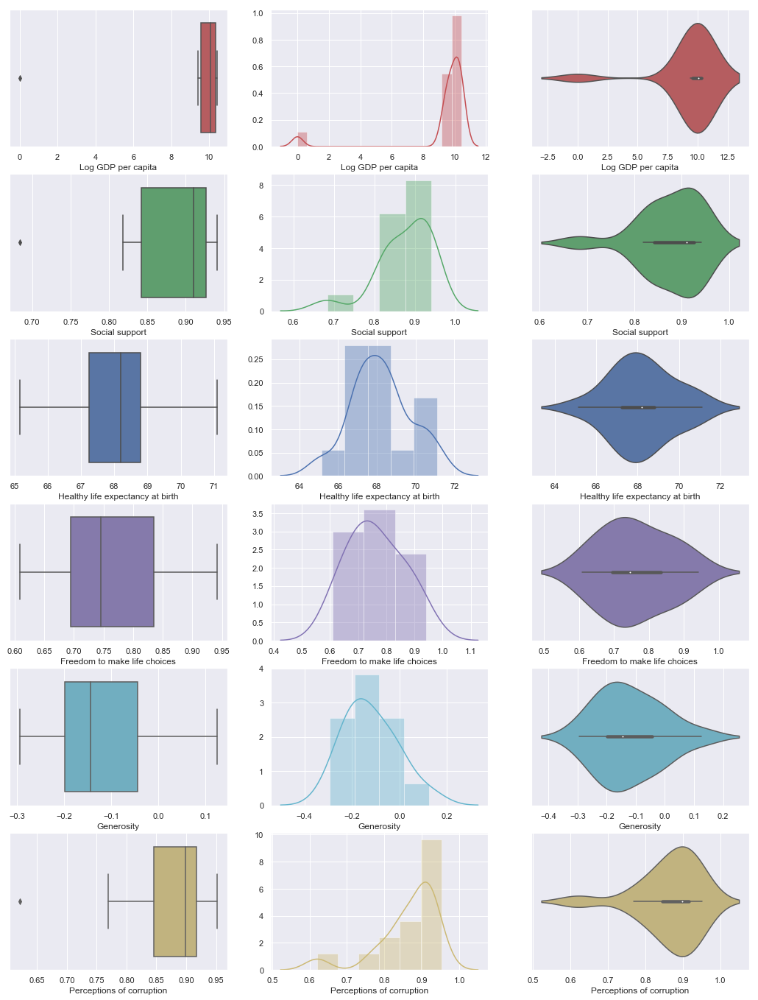

In [152]:


f, axes = plt.subplots(6, 3, figsize=(18, 24))
colors = ["r", "g", "b", "m", "c", "y"]
cols = filtered_df.columns.drop(['Country name', 'Life Ladder','code','Region','Year'])

count = 0
for var in cols:
    sb.boxplot(regionCountry[var], orient = "h", color = colors[count], ax = axes[count,0])
    sb.distplot(regionCountry[var], color = colors[count], ax = axes[count,1])
    sb.violinplot(regionCountry[var], color = colors[count], ax = axes[count,2])
    count += 1

In [153]:
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphics

import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly import tools

# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)



data =[ dict(
      type = 'choropleth',
        colorscale = 'Rainbow',
        locations = regionCountry['code'],
       z = regionCountry['Life Ladder'],
        text = regionCountry['Country name'],

        colorbar = dict(
            title = 'Life Ladder', 
            titlefont=dict(size=25),
            tickfont=dict(size=18))
      ) ]


#[go.Choropleth(
#    type = 'orthographic',
#    locations = mean_df['code'],
#    z = mean_df['Life Ladder'],
#  text = mean_df['Country name'],
   # colorscale = [
  #      [0, "rgb(5, 10, 172)"],
  #      [0.35, "rgb(40, 60, 190)"],
   #     [0.5, "rgb(70, 100, 245)"],
   #     [0.6, "rgb(90, 120, 245)"],
  #      [0.7, "rgb(106, 137, 247)"],
   #     [1, "rgb(220, 220, 220)"]
  #  ],
#    colorscale = 'Rainbow',
#    autocolorscale = False,
 #   reversescale = True,
 #   marker = go.choropleth.Marker(
#        line = go.choropleth.marker.Line(
 #           color = 'rgb(180,180,180)',
 #           width = 0.5
 #       )),
  #  colorbar = go.choropleth.ColorBar(
  #      tickprefix = '$',
 #       title = 'GDP<br>Billions US$'),
    
#)]

layout = go.Layout(
    title = go.layout.Title(
        text = '2018 Life Ladder'
    ),
    geo = go.layout.Geo(
          showland = True,
        showlakes = True,
        
        showcountries = True,
        showocean = True,
        countrywidth = 0.5,
        landcolor = 'rgb(255, 255, 255)',
       # lakecolor = 'rgb(0, 255, 255)',
        oceancolor = 'rgb(0, 255, 255)',
        showframe = True,
        showcoastlines = True,
        projection = go.layout.geo.Projection(
            type = 'orthographic'
        )
    ),
    annotations = [go.layout.Annotation(
        x = 0.55,
        y = 0.1,
        xref = 'paper',
        yref = 'paper',
    
        showarrow = False
    )]
)

fig = go.Figure(data = data, layout = layout)
py.iplot(fig, filename='world.html')

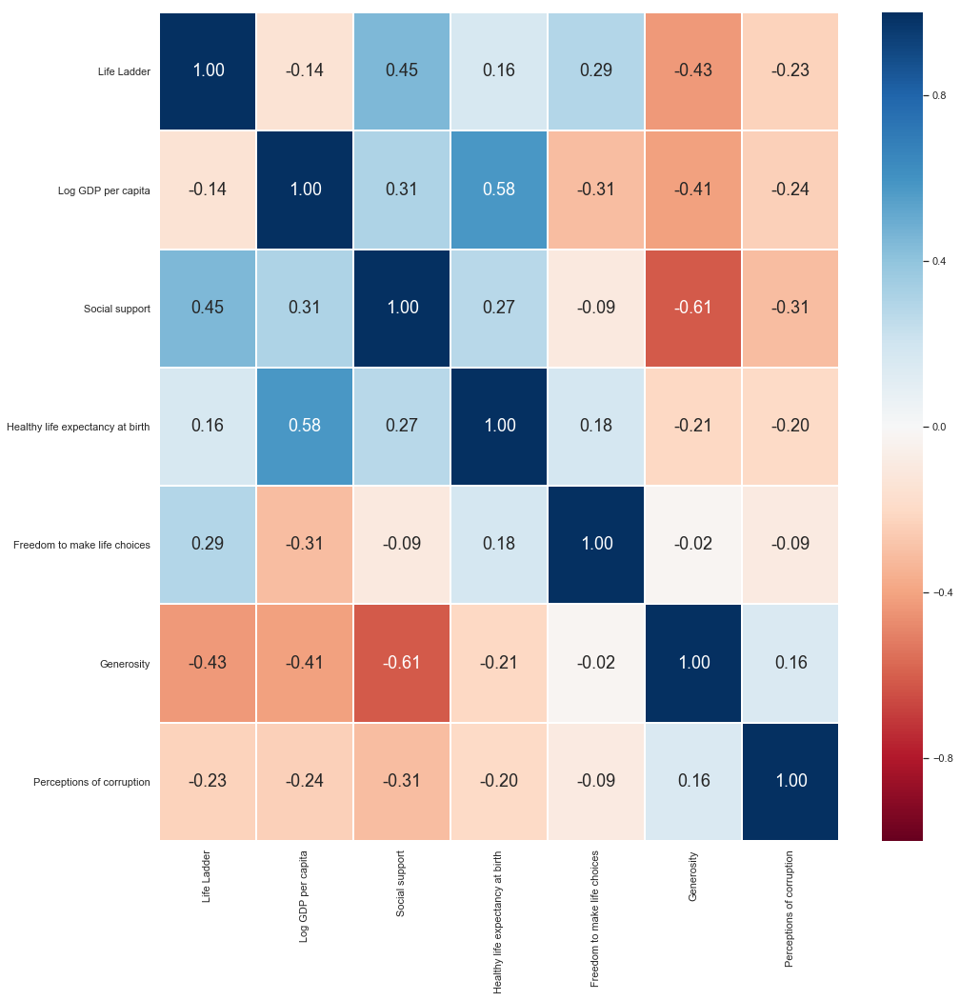

In [154]:

# the heatmap of the filtered dataset
f, axes = plt.subplots(1, 1, figsize=(16, 16))
sb.heatmap(regionCountry.corr(), vmin = -1, vmax = 1, linewidths = 1,
           annot = True, fmt = ".2f", annot_kws = {"size": 18}, cmap = "RdBu")

Intercept of Regression 	: b =  [3.94182693]
Coefficients of Regression 	: a =  [[-0.04124119  3.24421434 -0.02452656  1.52189781  0.35625365]]

                         Predictors  Coefficients
0                Log GDP per capita     -0.041241
1                    Social support      3.244214
2  Healthy life expectancy at birth     -0.024527
3      Freedom to make life choices      1.521898
4                        Generosity      0.356254



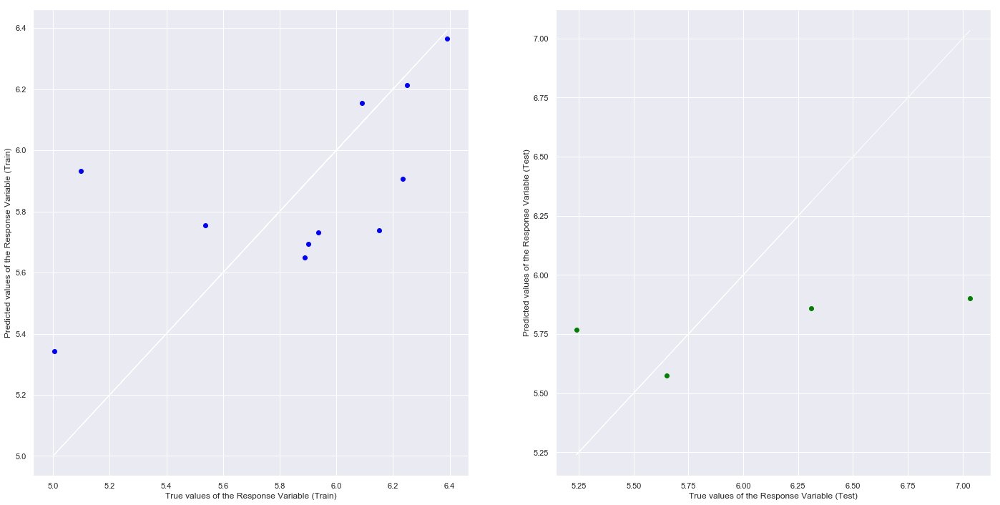

Goodness of Fit of Model 	Train Dataset
Explained Variance (R^2) 	: 0.40059123024756826
Mean Squared Error (MSE) 	: 0.11649262577246086

Goodness of Fit of Model 	Test Dataset
Explained Variance (R^2) 	: 0.041613056939566184
Mean Squared Error (MSE) 	: 0.44362346843607636


In [155]:
# Import essential models and functions from sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Extract Response and Predictors
predictors = ["Log GDP per capita", "Social support", "Healthy life expectancy at birth","Freedom to make life choices","Generosity"]

y = pd.DataFrame(regionCountry['Life Ladder'])
X = pd.DataFrame(regionCountry[predictors])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Linear Regression using Train Data
linreg = LinearRegression()         # create the linear regression object
linreg.fit(X_train, y_train)        # train the linear regression model

# Coefficients of the Linear Regression line
print('Intercept of Regression \t: b = ', linreg.intercept_)
print('Coefficients of Regression \t: a = ', linreg.coef_)
print()

# Print the Coefficients against Predictors
print(pd.DataFrame(list(zip(X_train.columns, linreg.coef_[0])), columns = ["Predictors", "Coefficients"]))
print()

# Predict Response corresponding to Predictors
y_train_pred = linreg.predict(X_train)
y_test_pred = linreg.predict(X_test)

# Plot the Predictions vs the True values
f, axes = plt.subplots(1, 2, figsize=(24, 12))
axes[0].scatter(y_train, y_train_pred, color = "blue")
axes[0].plot(y_train, y_train, 'w-', linewidth = 1)
axes[0].set_xlabel("True values of the Response Variable (Train)")
axes[0].set_ylabel("Predicted values of the Response Variable (Train)")
axes[1].scatter(y_test, y_test_pred, color = "green")
axes[1].plot(y_test, y_test, 'w-', linewidth = 1)
axes[1].set_xlabel("True values of the Response Variable (Test)")
axes[1].set_ylabel("Predicted values of the Response Variable (Test)")
plt.show()

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_train, y_train))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_train, y_train_pred))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Explained Variance (R^2) \t:", linreg.score(X_test, y_test))
print("Mean Squared Error (MSE) \t:", mean_squared_error(y_test, y_test_pred))
# Basic Libraries
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt # we only need pyplot
sb.set() # set the default Seaborn style for graphicsprint()